In [13]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns
import missingno as msno
import plotly.express as px
import random
import warnings
warnings.filterwarnings('ignore')

seed = np.random.seed(30)

In [14]:
train = pd.read_csv("train.csv/train.csv")
test = pd.read_csv("test.csv/test.csv")
submission = pd.read_csv("sample_submission.csv")

In [15]:
train.shape, test.shape

((160000, 202), (40000, 201))

**데이터 자료구조 확인**

In [16]:
train

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,train_1,0,15.4140,-2.1016,10.4773,4.8941,12.6506,-3.7205,5.1426,17.7048,...,-2.8810,8.1647,1.0927,2.1215,17.6536,3.2253,-2.1234,8.9516,13.3485,-16.0178
1,train_2,0,12.3576,-8.1666,11.7785,2.8869,12.3183,-6.9847,4.2671,9.6710,...,0.2397,8.1569,-1.0753,5.4679,23.6376,-0.5022,9.2414,8.2427,10.7546,-3.4394
2,train_3,0,9.4142,-8.6132,7.2196,3.2496,10.6550,-3.3245,5.1010,18.5389,...,8.1638,9.2399,1.0160,7.4548,17.0933,0.0715,-4.0455,9.4586,17.8789,-13.9784
3,train_4,0,13.0647,-0.7917,13.0270,8.7865,10.2252,-2.9311,6.7299,11.8682,...,9.3914,7.5576,0.4784,1.2138,19.0498,-1.5634,7.3092,8.4344,18.1104,-7.7668
4,train_5,0,9.5222,-0.2727,8.2173,8.4071,12.7732,-10.3113,4.7486,13.7810,...,8.4802,0.9951,3.9973,1.9370,24.4786,-2.0294,-0.5454,8.7461,21.3832,14.1786
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
159995,train_159996,0,8.0801,-2.5523,10.6587,10.6660,8.7552,-10.8144,5.2019,21.1479,...,4.9773,7.5440,0.8520,4.9402,19.0033,1.5157,-9.3063,9.0586,14.9677,-11.2478
159996,train_159997,0,11.8371,-4.9598,12.9172,9.3759,13.0622,2.6849,5.2963,19.8298,...,2.3344,13.5478,3.1656,-1.5778,17.3154,-0.9673,4.9180,8.8015,13.2019,-21.5102
159997,train_159998,0,11.3368,1.2790,14.1568,11.9850,11.4859,0.2191,5.9112,19.7031,...,5.7440,11.3343,2.8999,4.8399,14.0429,0.5310,-0.0909,6.7786,13.0894,-0.6329
159998,train_159999,0,3.4660,-0.2570,4.3530,7.2045,11.4988,-7.0838,5.5081,13.7160,...,2.3471,2.6189,4.6409,9.0566,15.5558,-0.0071,1.0802,9.6420,14.3480,4.5444


In [17]:
test

,ID_code,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,test_1,8.7757,6.7905,9.2920,4.8443,10.8877,3.5858,4.7267,14.1264,1.9131,...,4.8996,4.4960,2.0201,5.0578,18.7864,-0.2550,4.0958,7.9291,17.6055,-7.4019
1,test_2,7.5491,-8.4764,15.4626,3.6803,12.1527,-7.1858,5.1952,13.7568,2.5632,...,10.2822,11.9053,3.0869,-0.6879,22.3453,-2.1595,4.1147,9.2685,12.2069,1.3086
2,test_3,5.8385,-6.9177,8.1589,6.7591,9.0635,4.9003,4.7126,21.1854,-3.5385,...,0.0732,10.2627,-0.3105,6.8481,15.2119,-0.5050,1.8873,8.6977,18.6569,11.5001
3,test_4,15.6901,-7.7904,8.3676,6.3246,9.8144,6.9361,4.5284,11.7888,3.3775,...,11.8331,4.3828,2.9730,2.4989,18.6336,1.0621,-3.8953,8.7950,12.9313,-3.1393
4,test_5,15.5726,-6.6387,12.0251,7.2093,10.3838,-8.9961,4.8868,18.8259,-5.2734,...,7.9042,10.4118,3.3438,0.4358,16.0511,0.7758,-3.3334,7.7918,18.2619,-3.2074
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39995,test_39996,13.9605,1.6317,16.5365,5.5922,12.2347,-14.3060,5.0389,18.4215,4.0158,...,-1.3783,8.9957,2.2425,9.3388,14.8871,0.8290,-1.0208,8.3668,16.5769,2.4484
39996,test_39997,7.4985,4.7339,11.9952,6.2574,9.8171,4.6362,4.6372,13.3072,-0.5075,...,5.5200,9.0240,2.1368,4.9087,16.1938,0.5539,6.7445,10.1029,20.6326,-19.7800
39997,test_39998,4.5195,3.8886,7.4813,8.1466,11.8629,-4.4444,5.1001,23.0027,-3.2955,...,7.0380,3.5980,1.9735,3.4259,15.9605,1.0190,3.0311,6.7328,15.8304,-2.2132
39998,test_39999,8.8422,3.3068,8.3702,9.4941,11.5611,13.2109,5.3921,11.9120,-2.1810,...,7.4395,10.4932,3.7310,11.7952,17.9021,-1.4007,-6.2355,9.4922,14.9396,-9.6255


In [18]:
train.describe()

,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
count,160000.000000,160000.000000,160000.000000,160000.000000,160000.000000,160000.000000,160000.000000,160000.000000,160000.000000,160000.000000,...,160000.000000,160000.000000,160000.000000,160000.000000,160000.000000,160000.000000,160000.000000,160000.000000,160000.000000,160000.000000
mean,0.100487,10.686423,-1.635005,10.717822,6.798371,11.078359,-5.063101,5.411429,16.546195,0.278720,...,3.231118,7.437430,1.926908,3.331891,17.981283,-0.137477,2.301247,8.908436,15.870663,-3.322579
std,0.300650,3.039724,4.048365,2.646578,2.041822,1.623850,7.878059,0.867974,3.418934,3.332611,...,4.563838,3.024263,1.476769,3.993505,3.133260,1.430700,5.450803,0.921079,3.013206,10.430896
min,0.000000,0.408400,-15.043400,2.117100,-0.040200,5.074800,-32.562600,2.347300,5.749400,-10.505500,...,-14.093300,-2.691700,-3.814500,-11.783400,8.694400,-5.261000,-14.209600,5.960600,6.299300,-38.852800
25%,0.000000,8.460400,-4.747125,8.722075,5.258000,9.880675,-11.218200,4.769400,13.947575,-2.323225,...,-0.069275,5.157400,0.891100,0.580475,15.620400,-1.165900,-1.942200,8.254300,13.828400,-11.187300
50%,0.000000,10.529800,-1.623700,10.581400,6.829450,11.109900,-4.826700,5.387400,16.460200,0.386900,...,3.197700,7.348050,1.900850,3.397150,17.944900,-0.168900,2.414100,8.888700,15.932150,-2.825700
75%,0.000000,12.764525,1.349175,12.521625,8.321900,12.261800,0.940175,6.006400,19.102825,2.933650,...,6.411450,9.512525,2.945000,6.209025,20.378600,0.833900,6.552475,9.593500,18.063050,4.821300
max,1.000000,20.315000,10.376800,19.353000,13.188300,16.671400,17.251600,8.447700,27.691800,10.151300,...,18.342300,16.716500,8.402400,17.908600,27.928800,4.272900,17.684100,12.000400,26.079100,28.500700


In [19]:
train.dtypes.to_frame()

,0
ID_code,object
target,int64
var_0,float64
var_1,float64
var_2,float64
...,...
var_195,float64
var_196,float64
var_197,float64
var_198,float64


* train 데이터에는 예측해야하는 target 변수가 포함되어 있고 test 데이터는 target 변수가 포함되어 있지 않는 것을 제외하고 동일한 형태 (변수 200개)
* 데이터에 target, id code를 제외한 설명변수를 수치형 변수만 있는 것으로 판단

**결측치 확인**

In [17]:
train.isna().sum()

ID_code    0
target     0
var_0      0
var_1      0
var_2      0
          ..
var_195    0
var_196    0
var_197    0
var_198    0
var_199    0
Length: 202, dtype: int64

<AxesSubplot:>

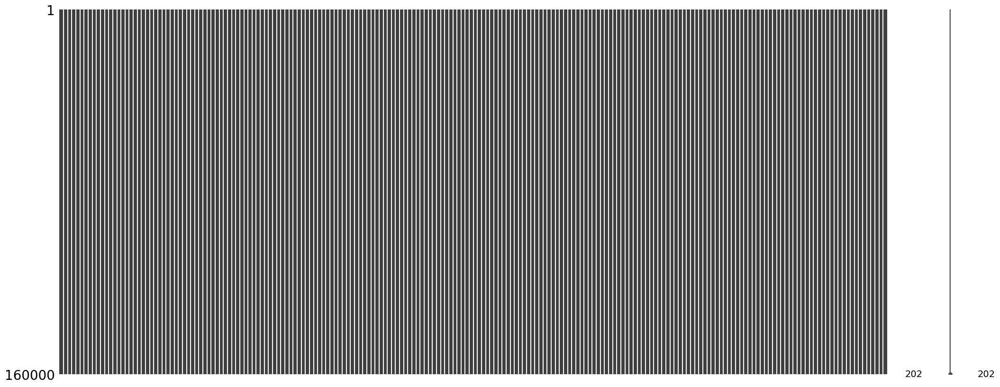

In [22]:
msno.matrix(train)

<AxesSubplot:>

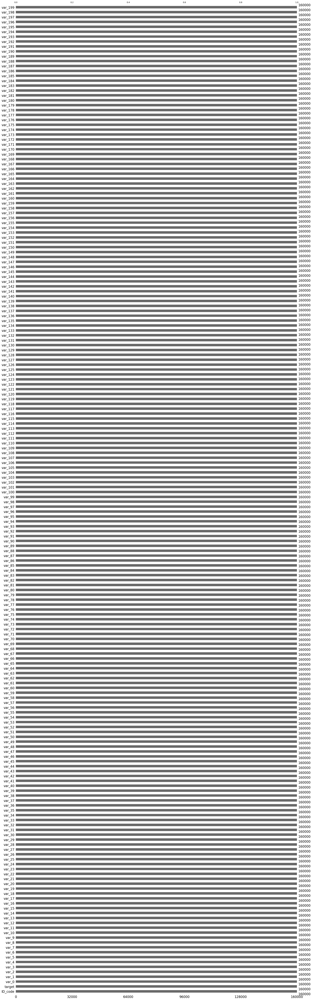

In [21]:
msno.bar(train)

* 데이터에 결측치가 없는 것으로 확인.

**중복 데이터 확인**

In [49]:
duplicate_value = sum(train.duplicated())
dup_percent = round(train.duplicated().sum()/len(train)*100, 2)
notdup_percent = round((len(train) -sum(train.duplicated()))/len(train)*100, 2)

In [50]:
dup_notdup_df = pd.DataFrame([notdup_percent, dup_percent],
                               index = pd.Index(["Duplicate X", "Duplicate O"]))
dup_notdup_df.columns = ['percent']
dup_notdup_df

,percent
Duplicate X,100.0
Duplicate O,0.0


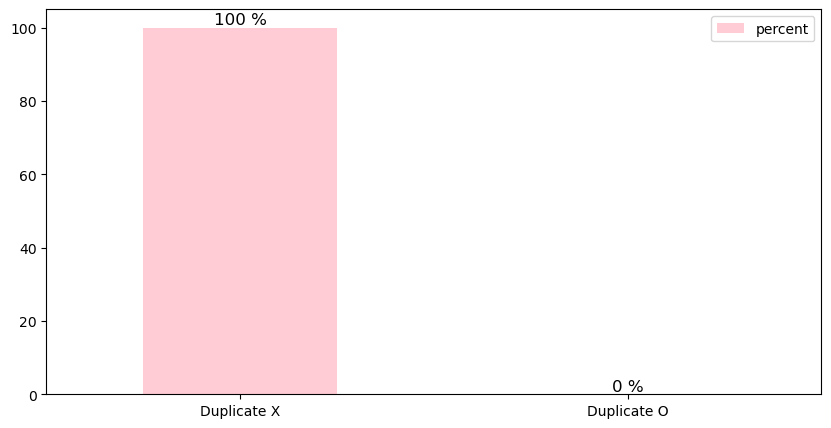

In [52]:
dup_notdup_df.plot.bar(figsize=(10, 5),
                       color = "pink",
                       alpha = 0.8)
plt.xticks(rotation = 0)

plt.text(0.0, 100, s = "%d %%"%(notdup_percent) ,
         color = "black",
         horizontalalignment = "center",
         verticalalignment = "bottom",
         fontsize = 12)
plt.text(1.0, 0, s = "%d %%"%(dup_percent) ,
         color = "black",
         horizontalalignment = "center",
         verticalalignment = "bottom",
         fontsize = 12)

plt.show()

* 데이터에 중복값 없는 것으로 확인.

**클래스 분포 시각화**

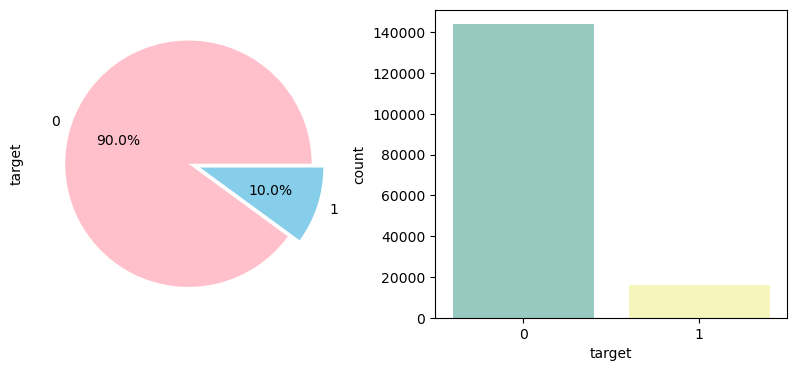

In [57]:
sns.color_palette("pastel")
fig, ax = plt.subplots(1,2,figsize=(10,4))
train['target'].value_counts().plot.pie(
    explode=[0,0.1],autopct='%1.1f%%',ax=ax[0], colors=['pink', 'skyblue']
)

sns.countplot('target', data=train, ax=ax[1], palette='Set3')
plt.show()

* 클래스 불균형으로 샘플링 처리해야하는 것을 확인함. 

* 클래스 불균형이 왜 문제가 되는지
    - 대부분의 머신러닝 모델은 class간의 데이터의 비율이 비슷하다는 가정에서 성립됨
    - training을 할 때 imbalance가 크다면 데이터의 수가 많은 class로 치우치게 predict하도록 학습됨
        - 학습을 수행하는 loss 값에 각각 데이터 샘플 별로 기여를 하기 때문에, 샘플 수가 많은 majority class만을 잘 예측하도록 학습됨
- 출처 https://hyeonchan523.github.io/ds/class-imbalance/


**설명변수 시각화**

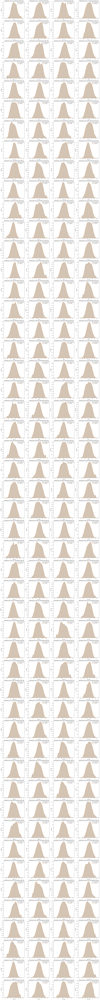

In [4]:
features = [col for col in train.columns.tolist() if col.startswith('var')]

nrows = 50
fig, axs = plt.subplots(nrows=50, ncols=4, figsize=(24, nrows * 5))

for i, feature in enumerate(features, 1):
    plt.subplot(50, 4, i)
    sns.kdeplot(train[feature], bw='silverman', label='Training Set', shade=True)
    sns.kdeplot(test[feature], bw='silverman', label='Test Set', shade=True)
    
    plt.tick_params(axis='x', which='major', labelsize=8)
    plt.tick_params(axis='y', which='major', labelsize=8)
    
    plt.legend(loc='upper right')
    plt.title('Distribution of {} in Training and Test Set'.format(feature))
    
plt.show()

* target 값과 상관없이 train 데이터와 test 데이터가 유사한 형태/분포를 가지므로 분류 과정에서 여향을 미치지 않을 것이라고 예상됨.

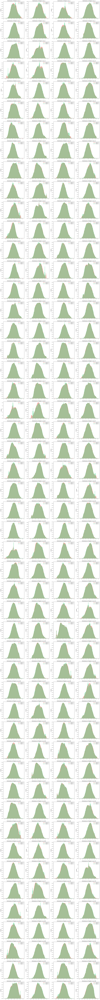

In [11]:
from sklearn.preprocessing import StandardScaler

features = [col for col in train.columns.tolist() if col.startswith('var')]

nrows = 50
fig, axs = plt.subplots(nrows=50, ncols=4, figsize=(24, nrows * 5))

for i, feature in enumerate(features, 1):
    plt.subplot(50, 4, i)
    
    sns.distplot(StandardScaler().fit_transform(train[train['target'] == 0][feature].values.reshape(-1, 1)), label='Target=0', hist=True, color='#e74c3c')
    sns.distplot(StandardScaler().fit_transform(train[train['target'] == 1][feature].values.reshape(-1, 1)), label='Target=1', hist=True, color='#2ecc71')
    
    plt.tick_params(axis='x', which='major', labelsize=8)
    plt.tick_params(axis='y', which='major', labelsize=8)
    
    plt.legend(loc='upper right')
    plt.xlabel('')
    plt.title('Distribution of Target in {}'.format(feature))
    
plt.show()

**상관관계 및 다중공선성 확인**

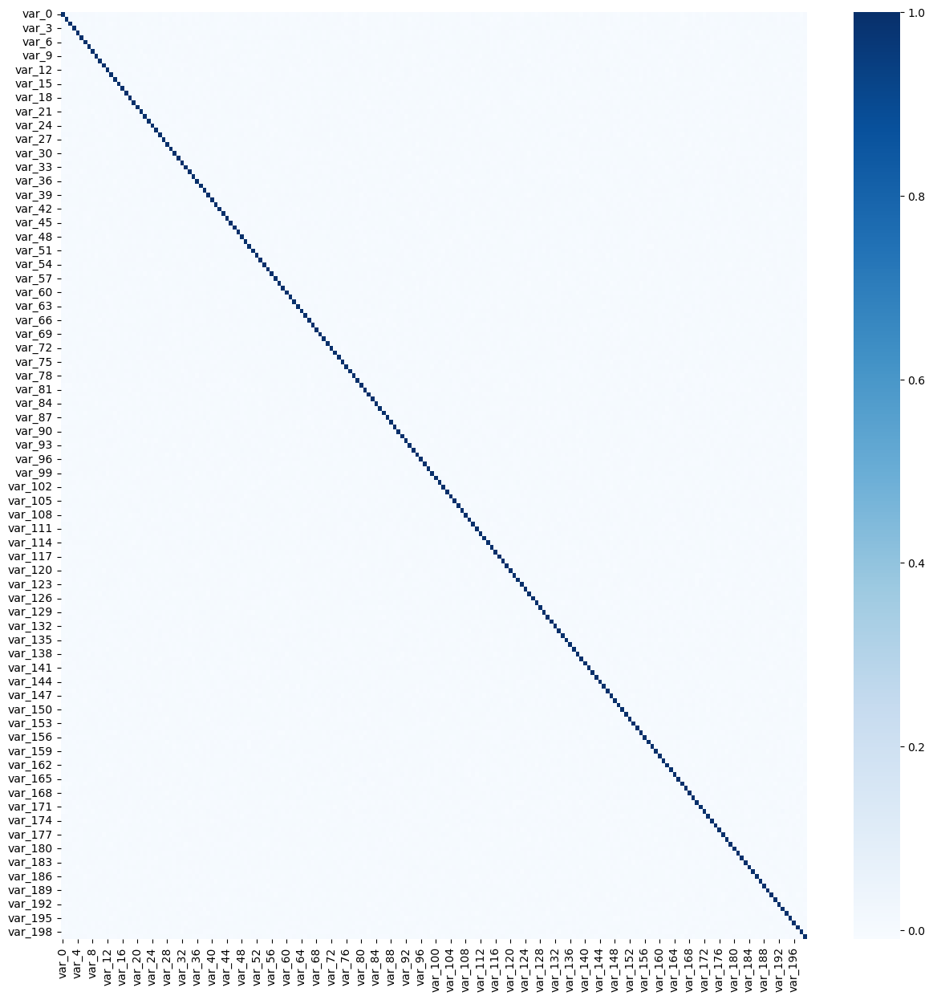

In [40]:
cor = indep.corr()

plt.figure(figsize = (15, 15))
sns.heatmap(cor, annot = False,
            cmap = "Blues")
plt.show()

(-0.1, 0.1)

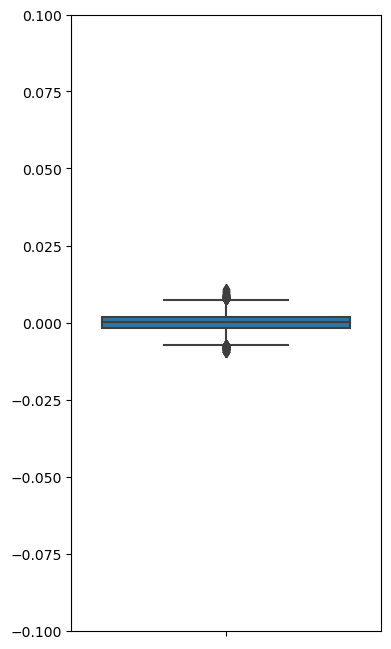

In [21]:
cor = train.iloc[:, 2:].corr(method='pearson')
plt.figure(figsize=(4,8))
sns.boxplot(y=cor.values)
plt.ylim((-0.1, 0.1))

* Feature 간 상관관계가 존재하지 않음을 확인.

**이상치 확인**

In [22]:
def rm_outlier(df, rm_col):
    dff = df

    for c in rm_col:
        firstq = dff[c].quantile(0.25)
        thirdq = dff[c].quantile(0.75)
        iqr = thirdq - firstq

        dff = dff[(dff[c] <= thirdq + 1.5*iqr) & (dff[c] >= firstq - 1.5*iqr)]
        dff.reset_index(drop=True, inplace=True)

    return dff

In [23]:
cols = train.iloc[:, 2:].columns
print(cols)

Index(['var_0', 'var_1', 'var_2', 'var_3', 'var_4', 'var_5', 'var_6', 'var_7',
       'var_8', 'var_9',
       ...
       'var_190', 'var_191', 'var_192', 'var_193', 'var_194', 'var_195',
       'var_196', 'var_197', 'var_198', 'var_199'],
      dtype='object', length=200)


In [24]:
rmout_train = rm_outlier(train, cols)
rmout_train

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,train_1,0,15.4140,-2.1016,10.4773,4.8941,12.6506,-3.7205,5.1426,17.7048,...,-2.8810,8.1647,1.0927,2.1215,17.6536,3.2253,-2.1234,8.9516,13.3485,-16.0178
1,train_2,0,12.3576,-8.1666,11.7785,2.8869,12.3183,-6.9847,4.2671,9.6710,...,0.2397,8.1569,-1.0753,5.4679,23.6376,-0.5022,9.2414,8.2427,10.7546,-3.4394
2,train_3,0,9.4142,-8.6132,7.2196,3.2496,10.6550,-3.3245,5.1010,18.5389,...,8.1638,9.2399,1.0160,7.4548,17.0933,0.0715,-4.0455,9.4586,17.8789,-13.9784
3,train_4,0,13.0647,-0.7917,13.0270,8.7865,10.2252,-2.9311,6.7299,11.8682,...,9.3914,7.5576,0.4784,1.2138,19.0498,-1.5634,7.3092,8.4344,18.1104,-7.7668
4,train_5,0,9.5222,-0.2727,8.2173,8.4071,12.7732,-10.3113,4.7486,13.7810,...,8.4802,0.9951,3.9973,1.9370,24.4786,-2.0294,-0.5454,8.7461,21.3832,14.1786
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
140017,train_159996,0,8.0801,-2.5523,10.6587,10.6660,8.7552,-10.8144,5.2019,21.1479,...,4.9773,7.5440,0.8520,4.9402,19.0033,1.5157,-9.3063,9.0586,14.9677,-11.2478
140018,train_159997,0,11.8371,-4.9598,12.9172,9.3759,13.0622,2.6849,5.2963,19.8298,...,2.3344,13.5478,3.1656,-1.5778,17.3154,-0.9673,4.9180,8.8015,13.2019,-21.5102
140019,train_159998,0,11.3368,1.2790,14.1568,11.9850,11.4859,0.2191,5.9112,19.7031,...,5.7440,11.3343,2.8999,4.8399,14.0429,0.5310,-0.0909,6.7786,13.0894,-0.6329
140020,train_159999,0,3.4660,-0.2570,4.3530,7.2045,11.4988,-7.0838,5.5081,13.7160,...,2.3471,2.6189,4.6409,9.0566,15.5558,-0.0071,1.0802,9.6420,14.3480,4.5444
